In [1]:
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt
import pandas as pd
import math

from skimage import data, io, filters

In [3]:
image_left = np.array(io.imread("annapurna_left_01.png"))

In [4]:
image_right = np.array(io.imread("annapurna_right_01.png"))

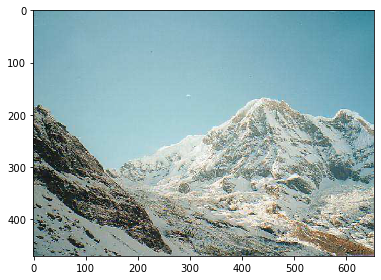

In [5]:
io.imshow(image_left)

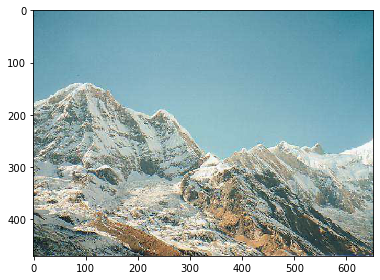

In [6]:
io.imshow(image_right)

In [7]:
image_left.dtype, image_right.dtype, image_left.shape, image_right.shape

(dtype('uint8'), dtype('uint8'), (471, 653, 4), (471, 652, 4))

In [8]:
ratio = image_left.shape[0]/image_left.shape[1]

### 문제 1. Feature Descriptor and Feature Matching

#### 1.1 이미지로부터 image patch를 생성하기 위한 함수 구현

In [28]:
# Problem 1-1

# 이미지를 읽고, 파라미터를 설정하세요.
image = np.array(io.imread("annapurna_left_01.png"))
width = 5
height = int(width*ratio)
stride = 3

def make_patches(image, width, height, stride):
    # 패치란 본래의 이미지보다 작은 이미지를 의미합니다.
    # 이미지의 KeyPoint 추출 및 Descriptor의 입력으로 이미지 전체가 아닌, 작은 패치를 주어야 합니다.
    # 이를 위한 기본 전처리 작업 함수라고 생각하시면 됩니다.
    # 또한, 이 함수의 결과 자체도 하나의 Descriptor 특징으로 사용될 수 있습니다 (문제에서 "image patch" 디스크립터라 칭함).
    # image는 우리가 작게 쪼개고자 하는 원본 이미지이며,
    # width, height는 만들고자 하는 패치의 가로, 세로의 크기입니다.
    # cv2 imread는 이미지를 Height, Width, Channel 형식으로 읽으므로 슬라이싱 시 주의하세요.
    # stride는 crop 시, 얼마 만큼의 간격으로 자를 것인지를 나타냅니다. 만약 stride=1이라면 1 pixel 간격으로 가장 dense하게 자르게 됩니다.

    patches = list()
    keypoints = list()
    H, W, _ = image.shape
    # 패치를 자르는 알고리즘을 구성하세요.
    # for 문 사용 시, H -> W 순으로 이중 for 문을 사용해 슬라이싱 하길 권장합니다.
    # cv2는 기본적으로 이미지를 (H, W, C) 형태로 취급합니다.
    # 슬라이싱 시에 패치의 중앙 위치 (원본 이미지 기준)를 따로 리스트에 담아 두어야 1-3) 문제 풀이가 가능합니다.
    # ...과 None 등은 직접 채우셔야 합니다.
    for h_i in range(0,H-height,stride):
        for w_i in range(0,W-width,stride):
            # 패치를 슬라이싱 하세요.
            
            patch = image[h_i:h_i+height, w_i:w_i+width].copy()

            # h_i, w_i를 이용하여, 원본 이미지 상에서 패치의 중앙점의 좌표를 구하세요.
            center_x = int((w_i+(w_i+width))/2)
            center_y = int((h_i+(h_i+height))/2)
            # cv2.KeyPoint 객체를 생성하세요. 아래는 하나의 예시입니다.
            keypoint = cv2.KeyPoint(center_x, center_y, size=(width + height) / 2.0)

            patches.append(patch)
            keypoints.append(keypoint)

    return patches, keypoints

# 결과로 나온 패치들은 (# of patches, h, w, 3)와 같은 형태가 되어야 합니다.
# h와 w 순서는 바뀔 수 있으나, (h, w) 순으로 구성하는 것이 추후 cv2 함수 사용 시 편합니다.
patches, keypoints = make_patches(image, width, height, stride)


#### 원본 이미지의 height, width 비율과 같은 패치를 생성하기 위해 height = int(width*ratio) 형태로 패치를 생성하였다. stride=3 간격으로 패치들을 생성하여 아래와 같이 총 33696개의 패치를 생성하였다. 그 중 임의로 20000번째 패치를 시각화한 결과는 아래와 같다.

In [29]:
len(patches)

33696

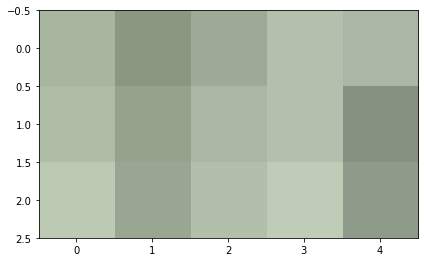

In [30]:
io.imshow(patches[20000])

In [31]:
len(keypoints)

33696

#### 1.2 Gradient와 Color Histogram을 구하기 위한 함수 구현

#### 안나푸르나 이미지의 horizental gradient를 검출할 수 있는 Sobel Edge Detection 라이브러리를 사용하였다. 또한 이미지 컬러 히스토그램을 추출하기 위해 256개의 bin 개수를 가진 cv2.calcHist 라이브러리를 사용하였다. 

In [32]:
# Problem 1-2
def extract_gradients(patch):
    # 주어진 이미지(패치)의 gradient를 구하는 알고리즘을 구성하세요.
    # X, Y의 gradient 외에 여러 gradient 계열(코너 등)의 특징 모두 가능합니다.
    # cv2 라이브러리를 사용하셔도 됩니다.
    gray = cv2.cvtColor(patch,cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    grads = cv2.Sobel(gray,-1,0,1)

    return grads

def extract_color_histogram(patch):
    # 주어진 이미지(패치)의 컬러 히스토그램을 추출하세요.
    # bin 개수 등은 자율적으로 선택하세요.
    # cv2 라이브러리를 사용하셔도 됩니다.
    gray = cv2.cvtColor(patch,cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    hists = cv2.calcHist(gray, [0], None, [256], [0,256])

    return hists

#cv2.calcHist 함수가 이미지에 대한 히스토그램 정보를 얻는데, 이 함수의 첫번째는 입력 이미지의 배열이며 
#두번째는 히스토그램을 얻을 채널 인덱스, 세번째는 Mask 이미지, 네번째는 X 축 요소(BIN)의 개수이고 
#다섯번째는 Y 축 요소값의 범위로 하나의 채널에 대한 화소 강도가 0~255이므로 대부분의 경우 [0,256]이 됩니다. 
#이 함수의 반환값은 256개의 요소를 갖는 배열입니다.

#### 1.3 첫번째 이미지에 대해 앞서 정의한 image patch와 gradient 특성(Sobel Edge), 컬러 히스토그램을 추출하였다. 먼저 각 patch 별 특성들을 리스트에 저장한 후, 추후에 진행할 match 함수에 적용할 수 있도록 rank 1로 reshape 및 array 변환을 적용하였다. 

In [33]:
# Problem 1-3

pair_image01 = image_left
pair_image02 = image_right

patches_01,keypoints01 = make_patches(pair_image01, 5,int(width*ratio),3)
patches_02,keypoints02 = make_patches(pair_image02, 5,int(width*ratio),3)

# 2) 추출한 패치들을 이용하여 디스크립터를 추출하세요.
patch_features_01 = list()
gradients_01 = list()
histograms_01 = list()
for patch in patches_01:
    # 각 패치마다, 1-2)에서 구현한 함수를 활용하여, 그라디언트와 컬러 히스토그램을 추출하세요.
    patch_feature = patch
    grad = extract_gradients(patch)
    hist = extract_color_histogram(patch)
    
    patch_feature = np.reshape(patch_feature, (-1,))
    grad = np.reshape(grad, (-1,))
    hist = np.reshape(hist, (-1,))
    patch_features_01.append(patch_feature.tolist())
    gradients_01.append(grad.tolist())
    histograms_01.append(hist.tolist())

patch_features_01 = np.array(patch_features_01, dtype=np.uint8)
gradients_01 = np.array(gradients_01, dtype=np.uint8)
histograms_01 = np.array(histograms_01, dtype=np.uint8)

#### 마찬가지로 두번째 이미지에 대해서도 동일한 과정을 적용하였다.

In [34]:
# 두 번째 이미지에 대해서도 똑같이 추출합니다.

patch_features_02 = list()
gradients_02 = list()
histograms_02 = list()
for patch in patches_02:

    patch_feature = patch
    grad = extract_gradients(patch)
    hist = extract_color_histogram(patch)

    patch_feature = np.reshape(patch_feature, (-1,))
    grad = np.reshape(grad, (-1,))
    hist = np.reshape(hist, (-1,))

    patch_features_02.append(patch_feature.tolist())
    gradients_02.append(grad.tolist())
    histograms_02.append(hist.tolist())

patch_features_02 = np.array(patch_features_02, dtype=np.uint8)
gradients_02 = np.array(gradients_02, dtype=np.uint8)
histograms_02 = np.array(histograms_02, dtype=np.uint8)

 #### gradients_01, gradients_02를 이용한 매칭 및 결과

#### Gradient 특성을 이용해 매칭을 수행한 결과를 거리 기준으로 가장 가까운 50개를 표현해본 결과, 이미지의 하늘 부분에서 매치가 일어난 것을 확인할 수 있었다.

In [35]:
# 3) 추출된 특징을 이용하여, 매칭을 수행하세요.
# cv2의 BruteForce Matcher와 같은 함수를 이용해 진행하시면 됩니다.
matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

matches = matcher.match(gradients_01,gradients_02)

# match 결과를 모두 plot 할 수 없으므로, distance와 같은 기준으로 sorting 하여
# 가까운 matching 10~50개 정도 만을 가지고 결과를 그리시는 게 좋습니다.

sorted_matches = sorted(matches, key=lambda x:x.distance)

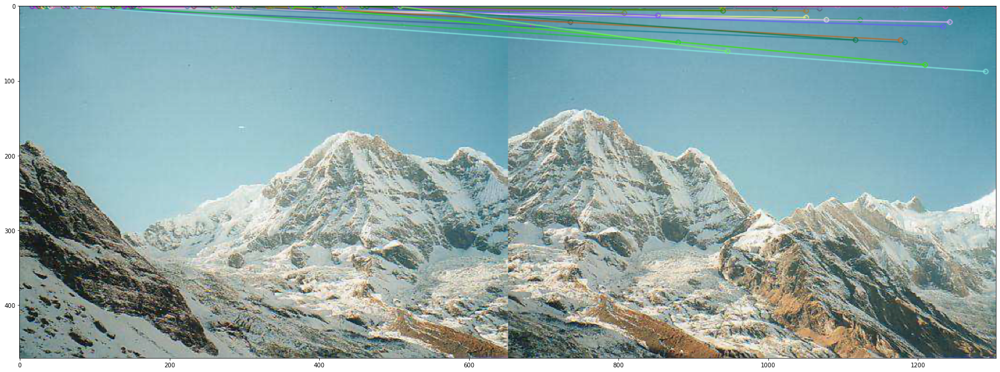

In [38]:
plt.figure(figsize=(30,50))
draw_image = cv2.drawMatches(pair_image01, keypoints01, pair_image02, keypoints02, sorted_matches[:50], None, flags=2 )
plt.imshow(draw_image)
plt.show()

#### histograms_01, histograms_02를 이용한 매칭 및 결과

#### Color Histogram으로 매치를 수행한 결과 역시 Gradient 특성을 이용한 경우와 마찬가지로 하늘 부분에서 매치가 일어났다.

In [39]:
matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = matcher.match(histograms_01,histograms_02)
sorted_matches = sorted(matches, key=lambda x:x.distance)

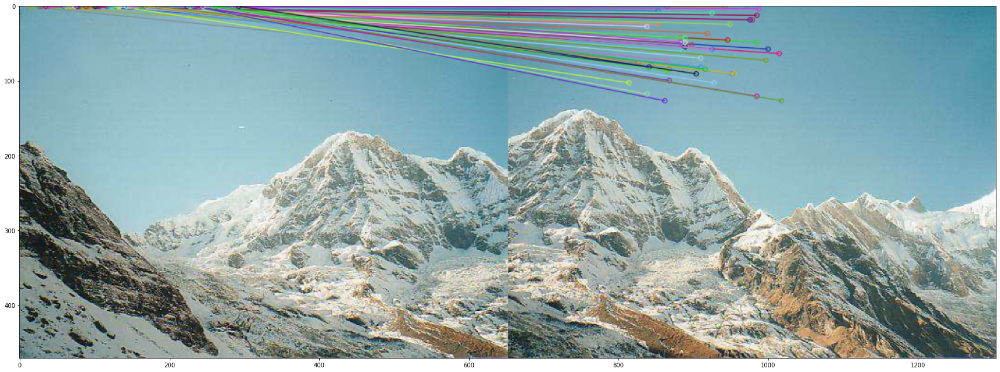

In [40]:
plt.figure(figsize=(30,50))
draw_image = cv2.drawMatches(pair_image01, keypoints01, pair_image02, keypoints02, sorted_matches[:50], None, flags=2 )
plt.imshow(draw_image)
plt.show()

#### patch_features_01, patch_features_02를 사용한 매칭 결과

#### 각 이미지의 patch를 가지고 매치를 수행한 결과 역시 이미지의 하늘 부분에서 매칭이 일어난 것을 확인할 수 있었다.

In [41]:
matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = matcher.match(patch_features_01,patch_features_02)
sorted_matches = sorted(matches, key=lambda x:x.distance)

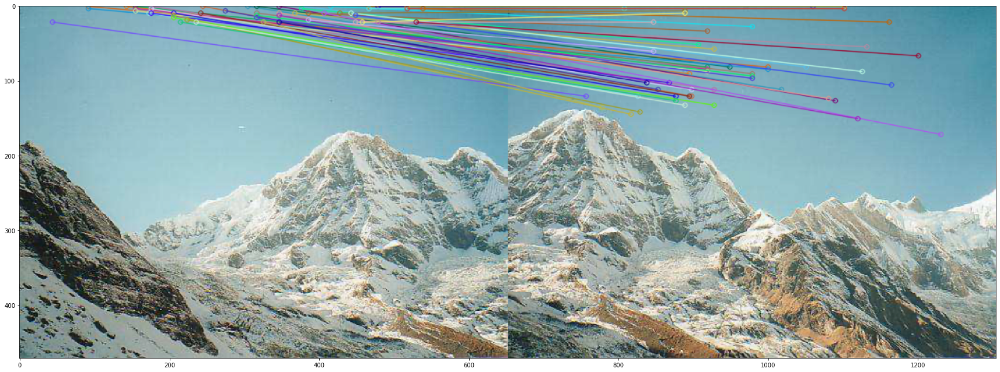

In [46]:
plt.figure(figsize=(30,50))
draw_image = cv2.drawMatches(pair_image01, keypoints01, pair_image02, keypoints02, sorted_matches[:50], None, flags=2 )
plt.imshow(draw_image)
plt.show()

#### 1.4 cv2에서 제공하는 라이브러리 중 SIFT를 사용하여 매치 수행 결과

#### SIFT를 사용하여 매치 결과를 그려본 결과, 아래와 같이 두 이미지의 주요 특징점이 높은 정확도로 매치가 된 것을 확인할 수 있었다. 앞서 라이브러리를 사용하지 않고 구현했던 image patch, gradient, color histogram을 각각 이용했던 결과에 비해 월등히 성능이 좋았다. 그 이유는 SIFT의 경우 각 픽셀의 gradient 방향을 히스토그램으로 나타내서 가장 많이 나온 방향을 주축으로 삼고, 주축을 0도로 보정해서 descriptor를 저장하는 방식으로 Orientation에 불변한 특성을 추출하여 매칭을 수행하기 때문일 것이다. 이에 비해 앞선 3가지 특징 매칭의 경우 단조로운 하늘 부분의 매칭 외에 해당 이미지만의 독특한 특성을 추출해내는 데 좋은 성능을 내지 못하였다.

In [109]:
sift_pair_image01 = image_left
sift_pair_image02 = image_right

In [110]:
sift = cv2.SIFT_create()

In [111]:
kp1, des1 = sift.detectAndCompute(sift_pair_image01,None)
kp2, des2 = sift.detectAndCompute(sift_pair_image02,None)

In [112]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

In [113]:
matches = bf.match(des1, des2)

In [114]:
matches = sorted(matches, key=lambda x:x.distance)

In [115]:
sift_draw_image = cv2.drawMatches(pair_image01,kp1,pair_image02,kp2,matches[:50],None,flags=2)

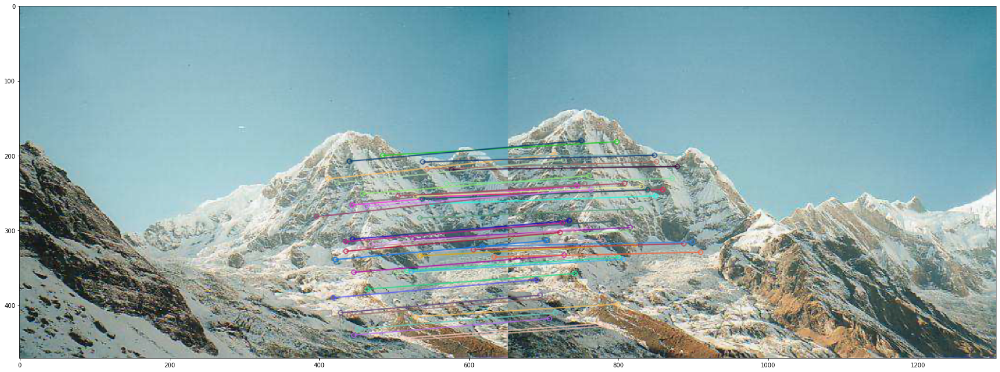

In [116]:
plt.figure(figsize=(30,50))
plt.imshow(sift_draw_image)
plt.show()

### 문제2. Homography and Stitching

#### 2.1 cv2.findHomography 사용 

In [129]:
# Problem 2-1
# 1) 1-4의 매칭 포인트들을 이용하여, cv2.findHomography를 사용해, Homography 행렬을 SVD 방식으로 구해보세요.

# 먼저, 임의의 paired 이미지를 읽습니다.
image_02 = image_left
image_01 = image_right

# cv2 함수에서 SIFT와 같은 디스크립터를 정의하세요.
descriptor = cv2.SIFT_create()

# 두 이미지에 대하여, Keypoint와 특징을 추출하세요.
keypoints_01, features_01 = sift.detectAndCompute(image_01,None)
keypoints_02, features_02 = sift.detectAndCompute(image_02,None)

# 위 포인트들에 대하여 1-3~4와 유사하게 매칭을 수행합니다.
matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

raw_matches = matcher.match(features_01,features_02)


In [130]:
match_distance=[]
for raw_match in raw_matches:
    match_distance.append(raw_match.distance)

In [131]:
match_distance = pd.DataFrame(match_distance)
match_distance.describe()

,0
count,732.000000
mean,243.041801
std,71.926929
min,66.768257
25%,187.683861
50%,262.990494
75%,300.044159
max,367.328186


In [146]:
threshold_for_good_matches = 100

#### 먼저 raw_match 중 좋은 매칭 결과를 Homography 계산에 반영하기 위해 raw_match.distance를 확인한 결과, 최소 거리는 약 67임을 확인하였다. 또한 거리가 가까운 기준으로 상위 25% 이내의 경우 약 188의 거리를 나타내었다. 따라서 거리가 가장 가까운 기준으로 매칭을 선별하고자 threshold를 100으로 적용하였다. 이렇게 해서 아래와 같이 매치 19개를 선별하였다. 

In [147]:
# 위 matches를 모두 사용하면 outlier 때문에 homography 추출이 올바르지 않을 가능성이 큽니다.
# 따라서, 본인이 생각한 기준으로 raw_matches 중 좋은 매칭 결과를 선별해줍니다.

good_matches = []
for raw_match in raw_matches:
    if raw_match.distance<threshold_for_good_matches:
        good_matches.append(raw_match)

In [148]:
good_matches = tuple(good_matches)

In [149]:
len(good_matches)

19

In [150]:
src_pts = np.float32([ keypoints_01[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints_02[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)

#### 위에서 선별한 매칭을 바탕으로 해당 매치 특성의 키포인트를 두 이미지에서 찾은 결과로 Homography 행렬을 구한 결과는 아래와 같다.

In [151]:
# 위 결과로 Homoraphy 행렬을 구합니다.
H, ok = cv2.findHomography(src_pts,dst_pts,0)

In [152]:
H

array([[ 5.57379027e-01,  1.28292992e-01,  3.28917773e+02],
       [-2.89990523e-01,  8.53601554e-01,  6.62092596e+01],
       [-6.23436575e-04, -8.96038818e-05,  1.00000000e+00]])

#### 2.2. RANSAC 사용

#### 이번에는 앞서 2-1에서 구한 raw_matches를 이용해 RANSAC option으로 Homography Matrix를 구한 결과이다. cv2.findHomography를 이용하여, cv2.RANSAC으로 설정하였다.

In [ ]:
#만약 H*srcPoints i와 dstPoints i 사이의 거리가 ransacReprojThreshold보다 작으면 정상치(inlier)로 간주합니다

In [140]:
src_pts_r = np.float32([ keypoints_01[m.queryIdx].pt for m in raw_matches ]).reshape(-1,1,2)
dst_pts_r = np.float32([ keypoints_02[m.trainIdx].pt for m in raw_matches ]).reshape(-1,1,2)

#### cv2.RANSAC 옵션을 사용하여 구한 H_ransac 결과는 아래와 같다. 

In [141]:
H_ransac, ok_ransac = cv2.findHomography(src_pts_r,dst_pts_r,cv2.RANSAC,2.0)

In [142]:
H_ransac

array([[ 5.99293708e-01,  1.47069705e-01,  3.25298233e+02],
       [-2.83854281e-01,  8.75322422e-01,  6.36475706e+01],
       [-5.81742958e-04, -5.84661587e-05,  1.00000000e+00]])

#### 2-3. 두 Homography Matrix를 이용한 image stiching 결과 비교

#### 앞서 구한 2-1의 H matrix와 2-2의 H_ransac matrix는 약간의 차이는 있으나 유사한 형태로, 아래와 같이 image stiching 결과도 양쪽 모두 우수한 성능을 나타냈다.  

#### 먼저 2-1에서 구한 H matrix를 이용한 결과이다. 거리가 가장 가까운 상위 19개의 매칭만을 선별하여 image stiching을 진행한 결과 좋은 성능의 결과를 얻을 수 있었다.

In [153]:
result_1 = cv2.warpPerspective(image_01, H, (image_01.shape[1]+image_02.shape[1], image_01.shape[0]))
result_1[0:image_02.shape[0], 0:image_02.shape[1]]=image_02

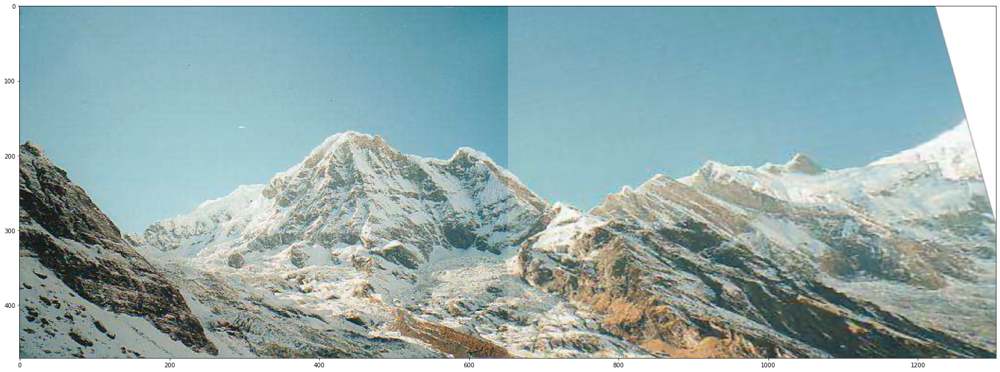

In [155]:
plt.figure(figsize=(30,50))
plt.imshow(result_1)
plt.show()

#### 다음으로 2-2에서 구한 H_ransac matrix를 이용한 결과이다. cv2.RANSAC옵션을 사용한만큼 좋은 성능을 보였다. RANSAC은 특히 전체 데이터의 20% 이내에는 아웃라이어에도 강력한 효과를 내는 알고리즘으로 일반적으로 많이 사용되고 있다.

In [157]:
result_ransac = cv2.warpPerspective(image_01, H_ransac, (image_01.shape[1]+image_02.shape[1], image_01.shape[0]))
result_ransac[0:image_02.shape[0], 0:image_02.shape[1]]=image_02

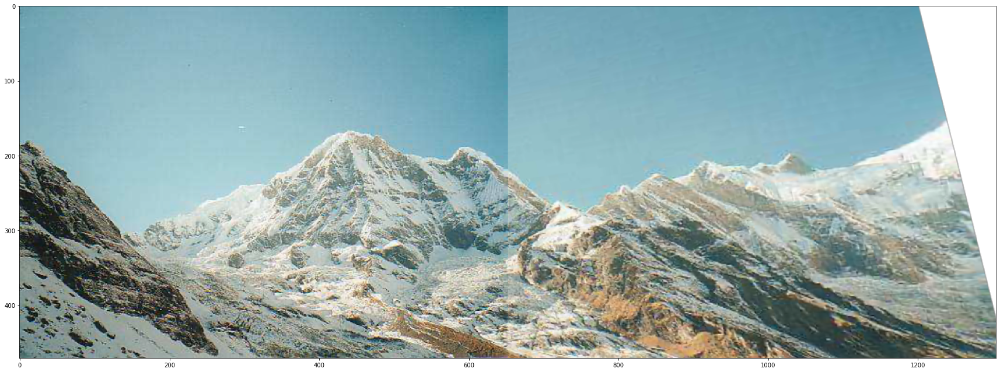

In [158]:
plt.figure(figsize=(30,50))
plt.imshow(result_ransac)
plt.show()

### 문제3. Homography with RANSAC 직접 구현

#### 3.1 Homography행렬 H를 구하는 함수 구현

#### 아래와 같은 단계로 작동하는 함수를 구현하였다. 

#### 1) 매칭된 특성의 키포인트 개수로부터 Random으로 겹치지 않는 4개의 인덱스를 추출하였다.

#### 2) 해당 인덱스를 기준으로 homography를 적용할 이미지와 stitching target이 될 이미지로부터 (x,y)좌표를 각 4개씩 추출하였다. 이 때 x는 width, y는 height을 의미한다. 

#### 3) 총 8개의 좌표값을 통해 8x9 matrix를 구성하고, 이를 특이값분해(SVD)하여 Homography matrix를 추출할 V matrix를 구한다. 이 때, np.linalg.svd()함수는 V Transpose를 리턴하므로, Homography matrix는 리턴된 V에서 V[-1]을 추출함으로써 구할 수 있다. 

#### 4) 추출한 Homography matrix를 이용하여 매칭 포인트들을 변환했을 때, 실제 매칭됐던 포인트와의 거리를 계산한다. 이 거리가 (threshold=5.0)보다 작으면 inlier로 판단한다.

#### 5) 위 시행을 1000번 반복하면서 inlier의 개수가 가장 많은 시행의 H_matrix를 H_best로 리턴한다. 

In [159]:
import random

In [167]:
def my_find_homography(src_kps, dst_kps):
    max_inliers = []
    inliers_idx = []
    H_best = None
    for i in range(1000):
        random_extract = []
        for i in range(4):
            idx = random.randrange(len(src_kps))
            while idx in random_extract:
                idx = random.randrange(len(src_kps))
            random_extract.append(idx)
       
    
        x1 = src_kps[random_extract[0]][0][0]
        y1 = src_kps[random_extract[0]][0][1]
        xt_1 = dst_kps[random_extract[0]][0][0]
        yt_1 = dst_kps[random_extract[0]][0][1]
    
        x2 = src_kps[random_extract[1]][0][0]
        y2 = src_kps[random_extract[1]][0][1]
        xt_2 = dst_kps[random_extract[1]][0][0]
        yt_2 = dst_kps[random_extract[1]][0][1]
    
        x3 = src_kps[random_extract[2]][0][0]
        y3 = src_kps[random_extract[2]][0][1]
        xt_3 = dst_kps[random_extract[2]][0][0]
        yt_3 = dst_kps[random_extract[2]][0][1]
    
        x4 = src_kps[random_extract[3]][0][0]
        y4 = src_kps[random_extract[3]][0][1]
        xt_4 = dst_kps[random_extract[3]][0][0]
        yt_4 = dst_kps[random_extract[3]][0][1]
    
        A = np.array([[-1*x1, -1*y1, -1, 0, 0, 0,  x1*xt_1, y1*xt_1, xt_1],
                      [0, 0, 0, -1*x1, -1*y1, -1, x1*yt_1, y1*yt_1, yt_1],
                      [-1*x2, -1*y2, -1, 0, 0, 0,  x2*xt_2, y2*xt_2, xt_2],
                      [0, 0, 0, -1*x2, -1*y2, -1, x2*yt_2, y2*yt_2, yt_2],
                      [-1*x3, -1*y3, -1, 0, 0, 0,  x3*xt_3, y3*xt_3, xt_3],
                      [0, 0, 0, -1*x3, -1*y3, -1, x3*yt_3, y3*yt_3, yt_3],
                      [-1*x4, -1*y4, -1, 0, 0, 0,  x4*xt_4, y4*xt_4, xt_4],
                      [0, 0, 0, -1*x4, -1*y4, -1, x4*yt_4, y4*yt_4, yt_4]])
    
        U,S,V = np.linalg.svd(A)
        H_matrix = V[-1].reshape(3,3)
        H_matrix = H_matrix/H_matrix[2,2]
    
        h11=H_matrix[0][0]
        h12=H_matrix[0][1]
        h13=H_matrix[0][2]
        h21=H_matrix[1][0]
        h22=H_matrix[1][1]
        h23=H_matrix[1][2]
        h31=H_matrix[2][0]
        h32=H_matrix[2][1]
    
        x_list = []
        for i in range(len(src_kps)):
            x = src_kps[i][0][0]
            x_list.append(x)

        y_list = []
        for i in range(len(src_kps)):
            y = src_kps[i][0][1]
            y_list.append(y)
    
        x_t_list = []
        for i in range(len(src_kps)):
            x = dst_kps[i][0][0]
            x_t_list.append(x)

        y_t_list = []
        for i in range(len(src_kps)):
            y = dst_kps[i][0][1]
            y_t_list.append(y)
        
        threshold_dist = 5.0
#         distance_sum = 0
#         least_distance = 1000000
        for i in range(len(src_kps)):
            x_estimate = (h11*x_list[i]+h12*y_list[i]+h13)/(h31*x_list[i]+h32*y_list[i]+1)
            y_estimate = (h21*x_list[i]+h22*y_list[i]+h23)/(h31*x_list[i]+h32*y_list[i]+1) 
            distance = math.sqrt(math.pow(x_t_list[i]-x_estimate,2)+math.pow(y_t_list[i]-y_estimate,2))
#             distance_sum += distance
            if distance < threshold_dist:
                inliers_idx.append(i)
                
#         if distance_sum < least_distance:
#             least_distance = distance_sum
#             H_best = H_matrix
                
        if len(inliers_idx)>len(max_inliers):
            max_inliers = inliers_idx
            H_best = H_matrix
        
        
    return H_best, max_inliers

#### Homography연산에는 앞서 2-1에서 구한 선별된 매칭의 키포인트들을 적용하였다.

In [187]:
result_3 = my_find_homography(src_pts,dst_pts)

In [188]:
result_3

(array([[ 3.54422823e-01,  1.20136479e-01,  3.33252503e+02],
        [-3.58002487e-01,  7.98645648e-01,  7.57939027e+01],
        [-9.28342898e-04, -1.18165403e-04,  1.00000000e+00]]),
 [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  13,
  14,
  15,
  16,
  18,
  0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  1,
  2,
  4,
  5,
  0,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  4,
  5,
  15,
  18,
  0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  0,
  3,
  4,


#### 3.2 구현 검증 및 2-2 결과와 비교

#### 앞서 3-1에서 직접 구현한 함수를 통해 얻은 Homography matrix로 image stitching을 진행한 결과는 아래와 같다. 잘 연결되는 부분도 있지만 부분적으로 연결이 매끄럽지 않은 지점도 관찰된다. 이 부분은 함수의 시행 횟수를 늘리는 방식으로 개선될 가능성도 있으나, 초기 인덱스를 랜덤으로 설정하는 알고리즘인 만큼 성능이 고르지 못한 면이 있을 것으로 생각한다.  

In [189]:
result_ransac_my = cv2.warpPerspective(image_01, result_3[0], (image_01.shape[1]+image_02.shape[1], image_01.shape[0]))
result_ransac_my[0:image_02.shape[0], 0:image_02.shape[1]]=image_02

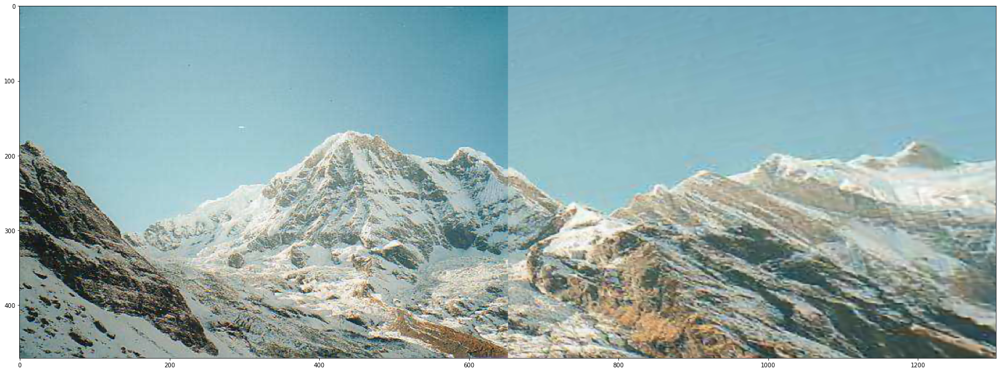

In [190]:
plt.figure(figsize=(30,50))
plt.imshow(result_ransac_my)
plt.show()

#### 마지막으로 Sedona 이미지에 2-1, 3-1에서 구현한 알고리즘을 적용한 결과도 전반적으로 좋은 image stitching 결과가 도출되었다. 

In [191]:
another_image_left = np.array(io.imread("./paired_images/sedona_left_01.png"))

In [192]:
another_image_right = np.array(io.imread("./paired_images/sedona_right_01.png"))

In [198]:
sedona_image_02 = another_image_left
sedona_image_01 = another_image_right

descriptor = cv2.SIFT_create()

sedona_keypoints_01, sedona_features_01 = sift.detectAndCompute(sedona_image_01,None)
sedona_keypoints_02, sedona_features_02 = sift.detectAndCompute(sedona_image_02,None)

matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
sedona_raw_matches = matcher.match(sedona_features_01,sedona_features_02)

sedona_good_matches = []
for sedona_raw_match in sedona_raw_matches:
    if sedona_raw_match.distance<threshold_for_good_matches:
        sedona_good_matches.append(sedona_raw_match)
        
sedona_good_matches = tuple(sedona_good_matches)

sedona_src_pts = np.float32([ sedona_keypoints_01[m.queryIdx].pt for m in sedona_good_matches ]).reshape(-1,1,2)
sedona_dst_pts = np.float32([ sedona_keypoints_02[m.trainIdx].pt for m in sedona_good_matches ]).reshape(-1,1,2)

In [199]:
result_sedona = my_find_homography(sedona_src_pts,sedona_dst_pts)

In [204]:
result_sedona_ransac_my = cv2.warpPerspective(sedona_image_01, result_sedona[0], (sedona_image_01.shape[1]+sedona_image_02.shape[1], sedona_image_01.shape[0]))
result_sedona_ransac_my[0:sedona_image_02.shape[0], 0:sedona_image_02.shape[1]]=sedona_image_02

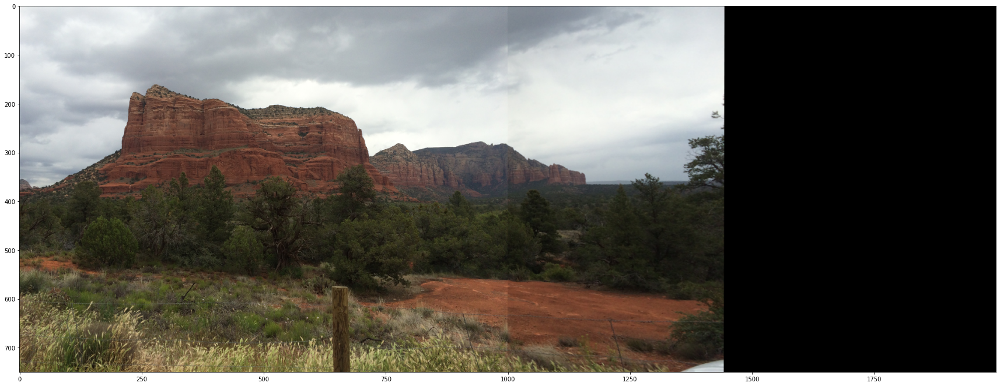

In [205]:
plt.figure(figsize=(30,50))
plt.imshow(result_sedona_ransac_my)
plt.show()